# EXPLORATORY DATA ANALYSIS

In [1]:
import pandas as pd
import sqlite3
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium import plugins

In [2]:
# Load dataset from sqlite database

# data = pd.read_sql_query("SELECT * FROM data_fe", conn)

data = pd.read_csv('H:/Study/IPCA/MIAA/MLA/TP2025/DataS1/jaguar_movement_with_countries_climate_data.csv')
# data = pd.read_csv('H:/Study/IPCA/MIAA/MLA/TP2025/DataS1/jaguar_movement_data_cleaned.csv')
data.head()

,event_id,timestamp,location_long,location_lat,individual_taxon_canonical_name,tag_local_identifier,individual_local_identifier_ID,study_name,country,hour,...,velocity,movement,acceleration,direction,change_in_direction,mean_daily_maximum_air_temperature,mean_daily_minimum_air_temperature,total_precipitation_month,highest_daily_amount_precipitation_month_tenths_mm,number_days_month_precipitation
0,131931.0,2015-10-14 13:00:00,-57.497689,-16.889058,Panthera onca,0,117,Jaguar_Taiama,Brazil,13,...,0.01,resting,-0.0100,0.248697,-2.3929,176.805,109.7225,176.0,38.0,6.0
1,131934.0,2015-10-14 16:00:00,-57.490583,-16.888502,Panthera onca,0,117,Jaguar_Taiama,Brazil,16,...,0.25,resting,0.0800,1.492676,1.2440,176.805,109.7225,176.0,38.0,6.0
2,131935.0,2015-10-14 17:00:00,-57.490542,-16.888545,Panthera onca,0,117,Jaguar_Taiama,Brazil,17,...,0.01,resting,-0.2400,2.387064,0.8944,176.805,109.7225,176.0,38.0,6.0
3,131945.0,2015-10-15 04:00:00,-57.484713,-16.888401,Panthera onca,0,117,Jaguar_Taiama,Brazil,4,...,0.06,resting,0.0045,1.546016,-0.8410,176.805,109.7225,176.0,38.0,6.0
4,131950.0,2015-10-15 09:00:00,-57.484605,-16.888420,Panthera onca,0,117,Jaguar_Taiama,Brazil,9,...,0.00,resting,-0.0120,1.745309,0.1993,176.805,109.7225,176.0,38.0,6.0


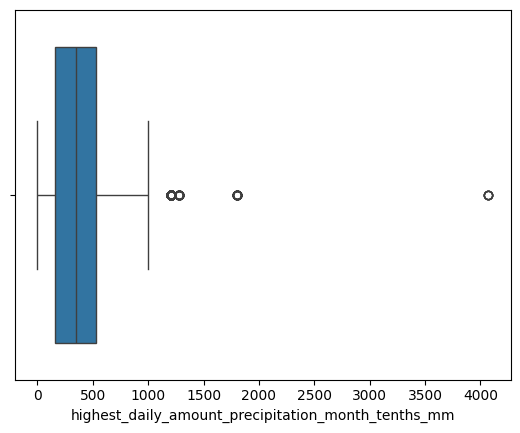

In [3]:
# Identify outliers
sns.boxplot(x=data['highest_daily_amount_precipitation_month_tenths_mm'])
plt.show()

In [4]:
# Combine country with the individual_taxon_canonical_name to create a new column called country_jaguar
data['country_jaguar'] = data['country'] + '_' + data['study_name']
data.head()

,event_id,timestamp,location_long,location_lat,individual_taxon_canonical_name,tag_local_identifier,individual_local_identifier_ID,study_name,country,hour,...,movement,acceleration,direction,change_in_direction,mean_daily_maximum_air_temperature,mean_daily_minimum_air_temperature,total_precipitation_month,highest_daily_amount_precipitation_month_tenths_mm,number_days_month_precipitation,country_jaguar
0,131931.0,2015-10-14 13:00:00,-57.497689,-16.889058,Panthera onca,0,117,Jaguar_Taiama,Brazil,13,...,resting,-0.0100,0.248697,-2.3929,176.805,109.7225,176.0,38.0,6.0,Brazil_Jaguar_Taiama
1,131934.0,2015-10-14 16:00:00,-57.490583,-16.888502,Panthera onca,0,117,Jaguar_Taiama,Brazil,16,...,resting,0.0800,1.492676,1.2440,176.805,109.7225,176.0,38.0,6.0,Brazil_Jaguar_Taiama
2,131935.0,2015-10-14 17:00:00,-57.490542,-16.888545,Panthera onca,0,117,Jaguar_Taiama,Brazil,17,...,resting,-0.2400,2.387064,0.8944,176.805,109.7225,176.0,38.0,6.0,Brazil_Jaguar_Taiama
3,131945.0,2015-10-15 04:00:00,-57.484713,-16.888401,Panthera onca,0,117,Jaguar_Taiama,Brazil,4,...,resting,0.0045,1.546016,-0.8410,176.805,109.7225,176.0,38.0,6.0,Brazil_Jaguar_Taiama
4,131950.0,2015-10-15 09:00:00,-57.484605,-16.888420,Panthera onca,0,117,Jaguar_Taiama,Brazil,9,...,resting,-0.0120,1.745309,0.1993,176.805,109.7225,176.0,38.0,6.0,Brazil_Jaguar_Taiama


## Key metrics for velocity grouped by movement category

In [5]:
movement_stats = data.groupby('movement')['velocity'].agg(['mean', 'median', 'std', 'count'])
print(movement_stats)

                   mean  median       std  count
movement                                        
resting        0.098396   0.040  0.153568  11369
slow_movement  1.509936   1.305  0.802127    156
unknown       -0.010000  -0.010       NaN      1


## Velocity by movement category

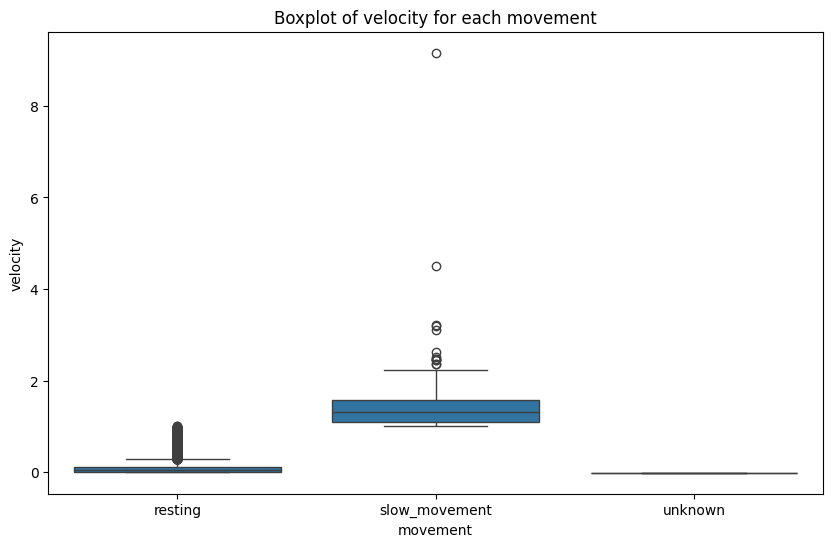

In [6]:
# Boxplot of velocity for each movement
plt.figure(figsize=(10, 6))
sns.boxplot(x='movement', y='velocity', data=data)
plt.title('Boxplot of velocity for each movement')
plt.show()

## Temporal patterns

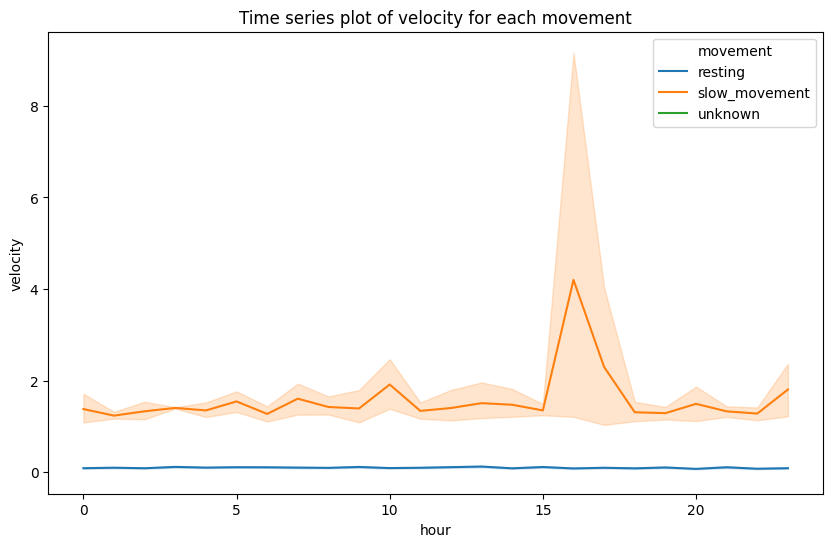

In [7]:
# Time series plot of velocity for each movement
plt.figure(figsize=(10, 6))
sns.lineplot(x='hour', y='velocity', hue='movement', data=data)
plt.title('Time series plot of velocity for each movement')
plt.show()

## Variation of velocity by hour for each jaguar

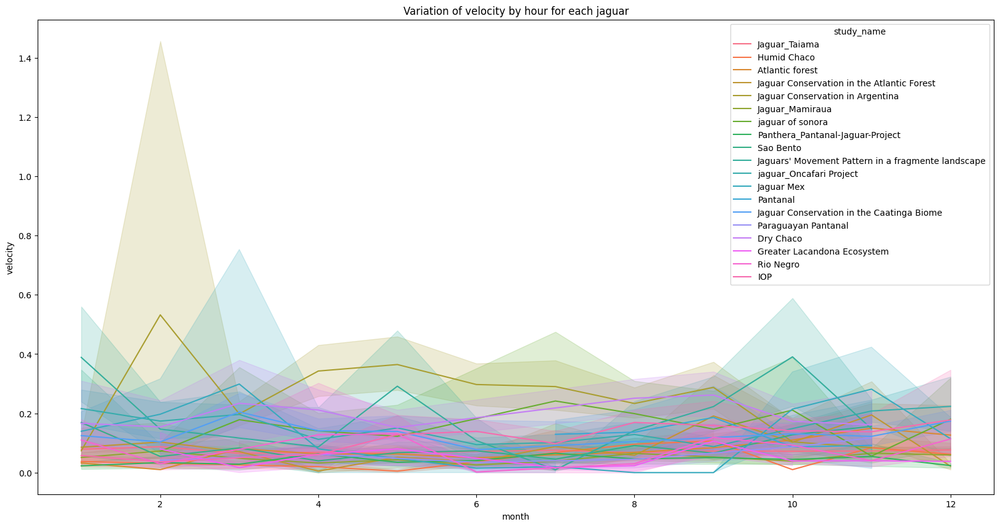

In [8]:
# Variation of velocity by hour for each jaguar of each country
plt.figure(figsize=(20, 10))
sns.lineplot(x='month', y='velocity', hue='study_name', data=data)
plt.title('Variation of velocity by hour for each jaguar')
plt.show()

## Seasonality to compare the month with velocity

Text(0.5, 1.0, 'Variation of velocity by season')

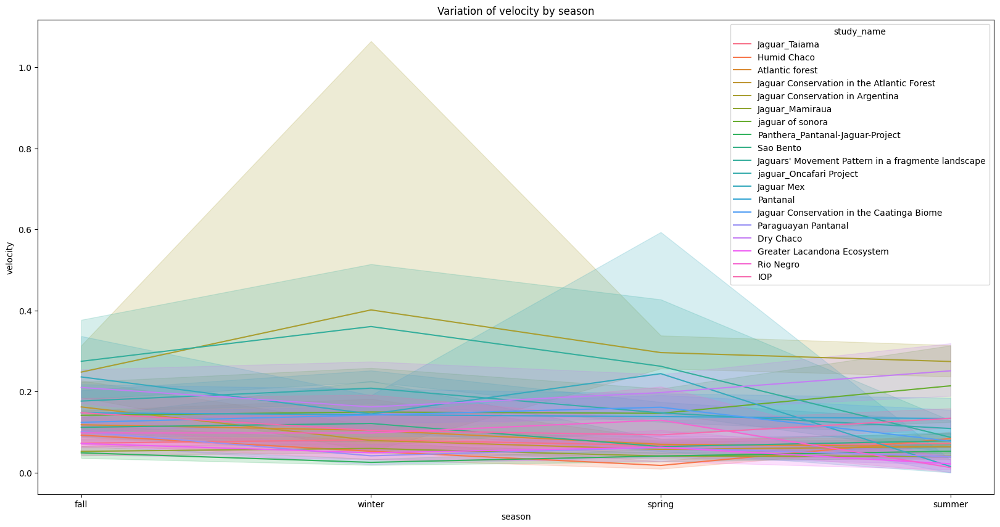

In [9]:
# Seaason feature engineering
data['month'] = pd.to_datetime(data['timestamp']).dt.month
data['season'] = data['month'].apply(lambda x: 'winter' if x in [12, 1, 2] else 'spring' if x in [3, 4, 5] else 'summer' if x in [6, 7, 8] else 'fall')
data['season'].value_counts()

# Variation of velocity by season
plt.figure(figsize=(20, 10))
sns.lineplot(x='season', y='velocity', hue='study_name', data=data)
plt.title('Variation of velocity by season')


Text(0.5, 1.0, 'Scatterplot of movement by highest_daily_amount_precipitation_month_tenths_mm and velocity')

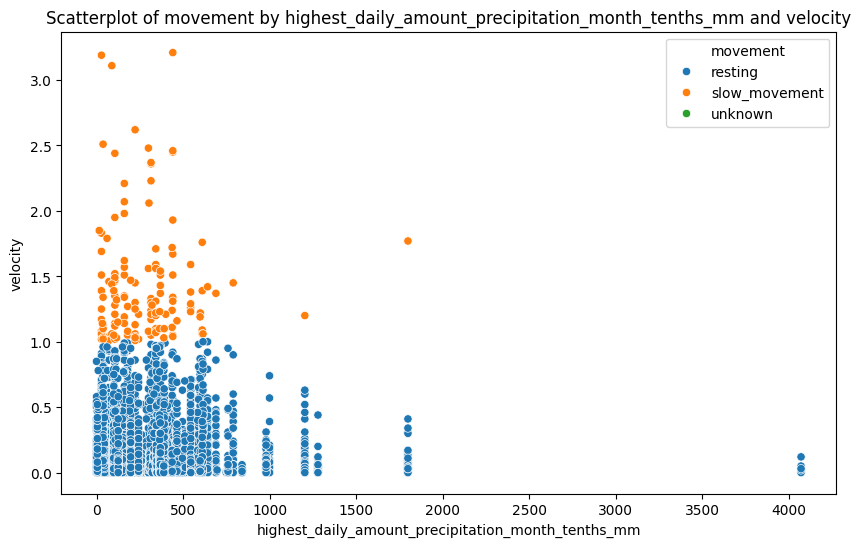

In [10]:
# Scatterplot of movement by highest_daily_amount_precipitation_month_tenths_mm and velocity
plt.figure(figsize=(10, 6))
sns.scatterplot(x='highest_daily_amount_precipitation_month_tenths_mm', y='velocity', hue='movement', data=data)
plt.title('Scatterplot of movement by highest_daily_amount_precipitation_month_tenths_mm and velocity')

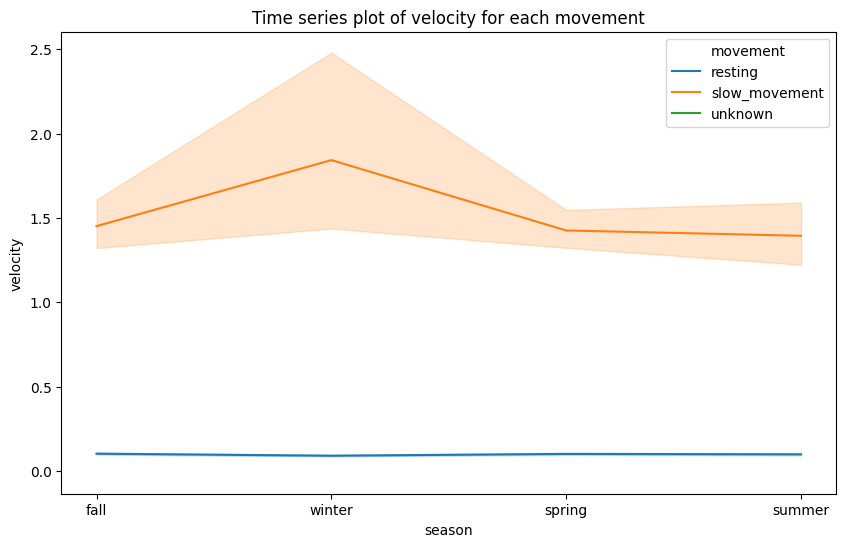

In [11]:
# Time series plot of velocity for each movement
plt.figure(figsize=(10, 6))
sns.lineplot(x='season', y='velocity', hue='movement', data=data)
plt.title('Time series plot of velocity for each movement')
plt.show()

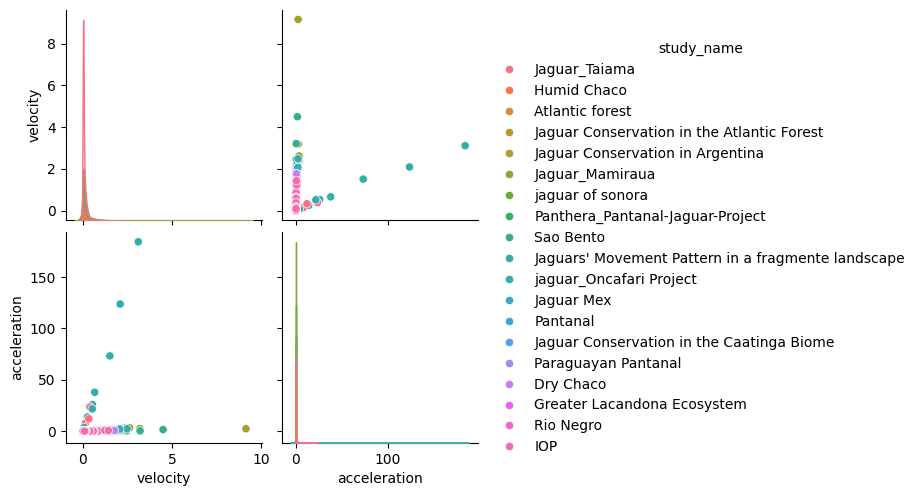

In [12]:
# Analyse velocity and acceleration for each jaguar
sns.pairplot(data, hue='study_name', vars=['velocity', 'acceleration'])
plt.show()


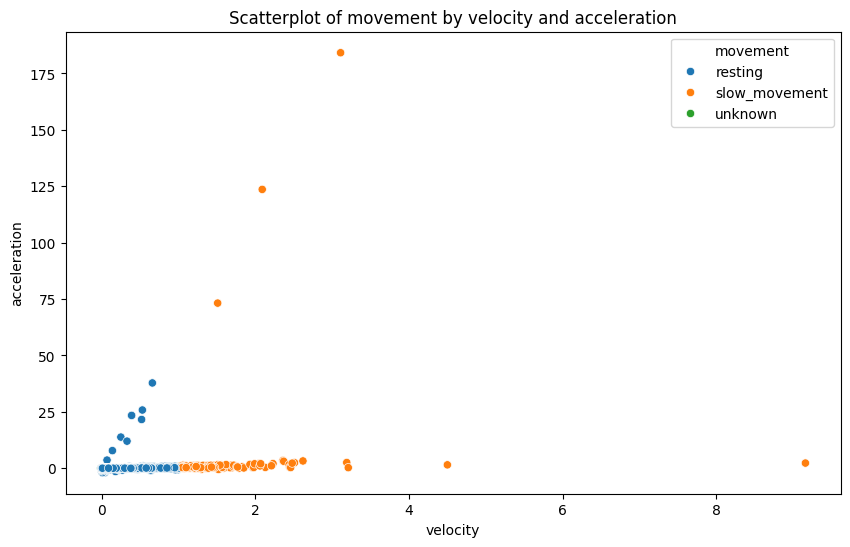

In [13]:
# Scatterplot of movement by velocity and acceleration
plt.figure(figsize=(10, 6))
sns.scatterplot(x='velocity', y='acceleration', hue='movement', data=data)
plt.title('Scatterplot of movement by velocity and acceleration')
plt.show()

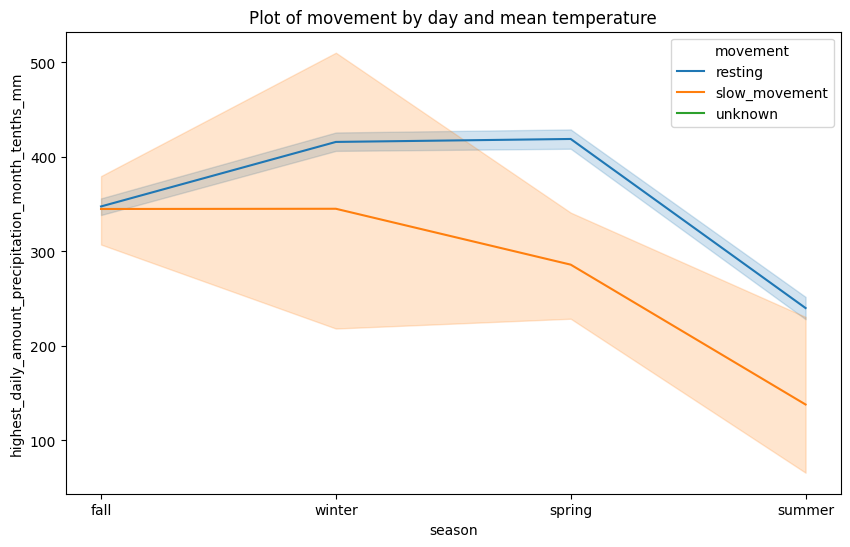

In [14]:
# Plot of movement by day and mean temperature
plt.figure(figsize=(10, 6))
sns.lineplot(x='season', y='highest_daily_amount_precipitation_month_tenths_mm', hue='movement', data=data)
plt.title('Plot of movement by day and mean temperature')
plt.show()

<Figure size 2000x700 with 0 Axes>

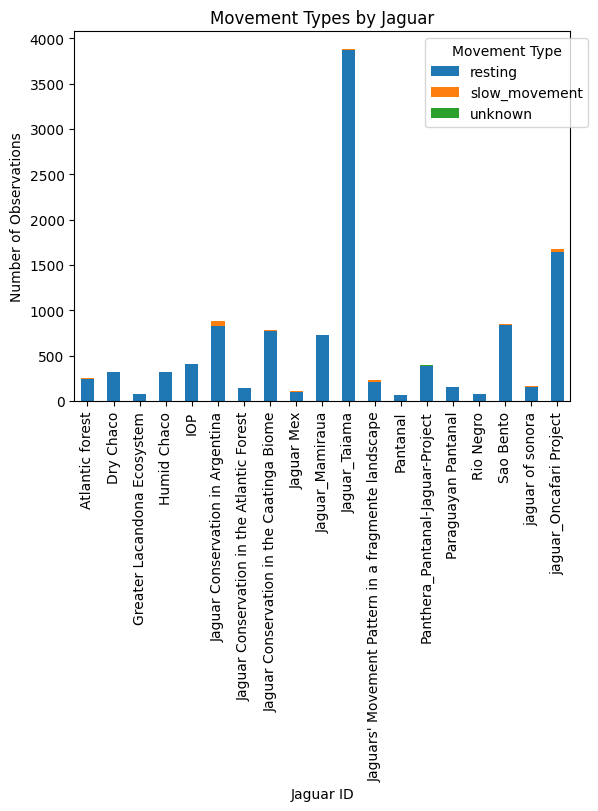

In [15]:
# Barplot of most active jaguars by movement
movement_counts = data.groupby(['study_name', 'movement']).size().unstack()

plt.figure(figsize=(20, 7))
movement_counts.plot(kind='bar', stacked=True)
plt.title('Movement Types by Jaguar')
plt.xlabel('Jaguar ID')
plt.ylabel('Number of Observations')
plt.legend(title='Movement Type', bbox_to_anchor=(1.05, 1))
plt.show()

## Trajectory for each jaguar

In [16]:
# Categorize country_jaguar by proximity of coordinates
data['location_lat'] = data['location_lat'].astype(float)
data['location_long'] = data['location_long'].astype(float)

# Create a new column called proximity
data['proximity'] = pd.cut(data['location_lat'], bins=3, labels=['low', 'medium', 'high'])

# Convert proximity to string before concatenation
data['country_jaguar_year'] = data['country'] + '_' + data['study_name'] + '_' + data['year'].astype(str)

# Enumerate the jaguars by proximity to ensure unique identification
# data['jaguar_id'] = data.groupby('country_jaguar_proximity').cumcount() + 1
data['country_jaguar_year'] = data['country_jaguar_year']

data.head()


,event_id,timestamp,location_long,location_lat,individual_taxon_canonical_name,tag_local_identifier,individual_local_identifier_ID,study_name,country,hour,...,change_in_direction,mean_daily_maximum_air_temperature,mean_daily_minimum_air_temperature,total_precipitation_month,highest_daily_amount_precipitation_month_tenths_mm,number_days_month_precipitation,country_jaguar,season,proximity,country_jaguar_year
0,131931.0,2015-10-14 13:00:00,-57.497689,-16.889058,Panthera onca,0,117,Jaguar_Taiama,Brazil,13,...,-2.3929,176.805,109.7225,176.0,38.0,6.0,Brazil_Jaguar_Taiama,fall,low,Brazil_Jaguar_Taiama_2015
1,131934.0,2015-10-14 16:00:00,-57.490583,-16.888502,Panthera onca,0,117,Jaguar_Taiama,Brazil,16,...,1.2440,176.805,109.7225,176.0,38.0,6.0,Brazil_Jaguar_Taiama,fall,low,Brazil_Jaguar_Taiama_2015
2,131935.0,2015-10-14 17:00:00,-57.490542,-16.888545,Panthera onca,0,117,Jaguar_Taiama,Brazil,17,...,0.8944,176.805,109.7225,176.0,38.0,6.0,Brazil_Jaguar_Taiama,fall,low,Brazil_Jaguar_Taiama_2015
3,131945.0,2015-10-15 04:00:00,-57.484713,-16.888401,Panthera onca,0,117,Jaguar_Taiama,Brazil,4,...,-0.8410,176.805,109.7225,176.0,38.0,6.0,Brazil_Jaguar_Taiama,fall,low,Brazil_Jaguar_Taiama_2015
4,131950.0,2015-10-15 09:00:00,-57.484605,-16.888420,Panthera onca,0,117,Jaguar_Taiama,Brazil,9,...,0.1993,176.805,109.7225,176.0,38.0,6.0,Brazil_Jaguar_Taiama,fall,low,Brazil_Jaguar_Taiama_2015


In [17]:
# Base map
m = folium.Map(
    location=[data['location_lat'].mean(), data['location_long'].mean()],
    zoom_start=5
)

# Trajectories
colors = sns.color_palette("hls", len(data['country_jaguar_year'].unique())).as_hex()

for i, (country_jaguar_year, group) in enumerate(data.groupby('country_jaguar_year')):
    color = colors[i]

    # Markers
    for _, row in group.iterrows():
        tooltip = f"{row['country_jaguar_year']} - {row['date']} - {row['movement']}"
        folium.CircleMarker(
            [row['location_lat'], row['location_long']],
            radius=5,
            color=color,
            tooltip=tooltip
        ).add_to(m)

    # Trajectory lines
    folium.PolyLine(
        locations=group[['location_lat', 'location_long']].values,
        color=color,
        weight=2.5
    ).add_to(m)

# Hunting overlay
hunting_locations = data[data['movement'] == 'hunting']
heat_data = [[row['location_lat'], row['location_long']] for _, row in hunting_locations.iterrows()]

plugins.HeatMap(
    heat_data,
    name='Hunting Activity',
    min_opacity=0.3,
    radius=15
).add_to(m)

folium.LayerControl().add_to(m)

m